In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import time

In [3]:
df=pd.read_csv('SpotifyFullSampleSet.csv')
print('df.shape', df.shape)
print('df.columns', df.columns)

df.shape (33717, 36)
df.columns Index(['playlist_name', 'collaborative', 'pid', 'modified_at', 'num_tracks',
       'num_albums', 'num_followers', 'num_edits', 'duration_ms',
       'num_tracks.1', 'pos', 'artist_name', 'track_uri', 'artist_uri',
       'track_name', 'album_uri', 'duration_ms.1', 'album_name',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'type', 'id', 'uri', 'track_href', 'analysis_url', 'duration_ms.2',
       'time_signature'],
      dtype='object')


In [4]:
starttime=time.time()

In [5]:
pd.set_option('display.max_columns',None)
df.head()

,playlist_name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_tracks.1,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms.1,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms.2,time_signature
0,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,0,Missy Elliott,0UaMYEvWZi0ZqiDOoHU3YI,spotify:artist:2wIVse2owClT7go1WT98tk,Lose Control (feat. Ciara & Fat Man Scoop),spotify:album:6vV5UrXcfyQD1wu4Qo2I9K,226863,The Cookbook,0.904,0.813,4,-7.105,0,0.1210,0.03110,0.006970,0.0471,0.810,125.461,audio_features,0UaMYEvWZi0ZqiDOoHU3YI,spotify:track:0UaMYEvWZi0ZqiDOoHU3YI,https://api.spotify.com/v1/tracks/0UaMYEvWZi0Z...,https://api.spotify.com/v1/audio-analysis/0UaM...,226864,4
1,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,1,Britney Spears,6I9VzXrHxO9rA9A5euc8Ak,spotify:artist:26dSoYclwsYLMAKD3tpOr4,Toxic,spotify:album:0z7pVBGOD7HCIB7S8eLkLI,198800,In The Zone,0.774,0.838,5,-3.914,0,0.1140,0.02490,0.025000,0.2420,0.924,143.040,audio_features,6I9VzXrHxO9rA9A5euc8Ak,spotify:track:6I9VzXrHxO9rA9A5euc8Ak,https://api.spotify.com/v1/tracks/6I9VzXrHxO9r...,https://api.spotify.com/v1/audio-analysis/6I9V...,198800,4
2,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,2,Beyoncé,0WqIKmW4BTrj3eJFmnCKMv,spotify:artist:6vWDO969PvNqNYHIOW5v0m,Crazy In Love,spotify:album:25hVFAxTlDvXbx2X2QkUkE,235933,Dangerously In Love (Alben für die Ewigkeit),0.664,0.758,2,-6.583,0,0.2100,0.00238,0.000000,0.0598,0.701,99.259,audio_features,0WqIKmW4BTrj3eJFmnCKMv,spotify:track:0WqIKmW4BTrj3eJFmnCKMv,https://api.spotify.com/v1/tracks/0WqIKmW4BTrj...,https://api.spotify.com/v1/audio-analysis/0WqI...,235933,4
3,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,3,Justin Timberlake,1AWQoqb9bSvzTjaLralEkT,spotify:artist:31TPClRtHm23RisEBtV3X7,Rock Your Body,spotify:album:6QPkyl04rXwTGlGlcYaRoW,267266,Justified,0.891,0.714,4,-6.055,0,0.1400,0.20200,0.000234,0.0521,0.818,100.972,audio_features,1AWQoqb9bSvzTjaLralEkT,spotify:track:1AWQoqb9bSvzTjaLralEkT,https://api.spotify.com/v1/tracks/1AWQoqb9bSvz...,https://api.spotify.com/v1/audio-analysis/1AWQ...,267267,4
4,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,4,Shaggy,1lzr43nnXAijIGYnCT8M8H,spotify:artist:5EvFsr3kj42KNv97ZEnqij,It Wasn't Me,spotify:album:6NmFmPX56pcLBOFMhIiKvF,227600,Hot Shot,0.853,0.606,0,-4.596,1,0.0713,0.05610,0.000000,0.3130,0.654,94.759,audio_features,1lzr43nnXAijIGYnCT8M8H,spotify:track:1lzr43nnXAijIGYnCT8M8H,https://api.spotify.com/v1/tracks/1lzr43nnXAij...,https://api.spotify.com/v1/audio-analysis/1lzr...,227600,4


In [8]:
df['pid'].unique()

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [5]:
df_minTracks=df[df['num_tracks']>50]

In [6]:
uniquePlaylist=(df_minTracks['pid'].unique()).tolist()
uniquePlaylist

[0,
 2,
 3,
 5,
 7,
 10,
 11,
 14,
 16,
 17,
 18,
 19,
 28,
 30,
 31,
 32,
 34,
 35,
 37,
 38,
 39,
 40,
 41,
 42,
 45,
 50,
 51,
 53,
 55,
 59,
 60,
 64,
 65,
 66,
 68,
 70,
 72,
 80,
 81,
 83,
 85,
 88,
 89,
 90,
 91,
 93,
 94,
 95,
 97,
 98,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 112,
 115,
 120,
 121,
 123,
 124,
 125,
 129,
 130,
 131,
 134,
 135,
 138,
 140,
 142,
 144,
 146,
 148,
 150,
 152,
 156,
 158,
 161,
 163,
 166,
 167,
 169,
 170,
 173,
 176,
 178,
 182,
 183,
 185,
 189,
 190,
 194,
 195,
 197,
 199,
 202,
 208,
 209,
 210,
 211,
 212,
 214,
 217,
 218,
 220,
 223,
 224,
 225,
 226,
 227,
 228,
 231,
 237,
 239,
 241,
 243,
 244,
 245,
 246,
 252,
 253,
 256,
 259,
 260,
 262,
 264,
 265,
 270,
 274,
 275,
 279,
 280,
 281,
 283,
 284,
 285,
 291,
 293,
 294,
 297,
 302,
 310,
 311,
 316,
 319,
 324,
 326,
 328,
 329,
 330,
 331,
 332,
 333,
 334,
 335,
 338,
 339,
 341,
 342,
 348,
 350,
 351,
 354,
 355,
 357,
 358,
 359,
 360,
 361,
 362,
 363,
 365,
 367,
 369,

In [7]:
#pid_qp=input('Enter A Query Playlist Number. \nAvailable lists are\n {}\n\n'.format(uniquePlaylist))
import random
pid_qp=random.choice(uniquePlaylist)


In [8]:
#This is to show which 'query playlist' has been randomly selected.
#This is needed to simulate an ideal use case where user exactly has the complete "query playlist".
#Just to reitereate, 'query playlist' is the ground truth for the songs in the playlist. 
#In real world use case, the user's playlist will be a subset of "query playlist".

print(pid_qp)

17


In [9]:
featureList=['pid','pos','track_uri','danceability','energy','key','loudness','mode','speechiness','acousticness','instrumentalness','liveness','valence','tempo']



In [10]:
df_minTracks[featureList].head()

,pid,pos,track_uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0,0,0UaMYEvWZi0ZqiDOoHU3YI,0.904,0.813,4,-7.105,0,0.1210,0.03110,0.006970,0.0471,0.810,125.461
1,0,1,6I9VzXrHxO9rA9A5euc8Ak,0.774,0.838,5,-3.914,0,0.1140,0.02490,0.025000,0.2420,0.924,143.040
2,0,2,0WqIKmW4BTrj3eJFmnCKMv,0.664,0.758,2,-6.583,0,0.2100,0.00238,0.000000,0.0598,0.701,99.259
3,0,3,1AWQoqb9bSvzTjaLralEkT,0.891,0.714,4,-6.055,0,0.1400,0.20200,0.000234,0.0521,0.818,100.972
4,0,4,1lzr43nnXAijIGYnCT8M8H,0.853,0.606,0,-4.596,1,0.0713,0.05610,0.000000,0.3130,0.654,94.759


In [11]:
playlistSong=df_minTracks[featureList].loc[:,['pid','pos','track_uri']]
playlistSong

,pid,pos,track_uri
0,0,0,0UaMYEvWZi0ZqiDOoHU3YI
1,0,1,6I9VzXrHxO9rA9A5euc8Ak
2,0,2,0WqIKmW4BTrj3eJFmnCKMv
3,0,3,1AWQoqb9bSvzTjaLralEkT
4,0,4,1lzr43nnXAijIGYnCT8M8H
...,...,...,...
33712,505,6,6TXPSDWAKyKw1rUYGdZw1F
33713,505,7,1AUA7JlrARv430PUJRK0Lp
33714,505,8,5WPVwig7Tl6NFJ5BL6ONhd
33715,505,9,3YhkHREtu481dJx4NMzeol


In [12]:
playlistSong=playlistSong.groupby(['pid','track_uri'])['pos'].first().unstack(fill_value=0)
playlistSong

track_uri,000xQL6tZNLJzIrtIgxqSl,006yrnQMCZpiUgkR612gC8,00BuKLSAFkaEkaVAgIMbeA,00Ci0EXS4fNPnkTbS6wkOh,00DYRuYJQzfI6dH4Adkimo,00JvkzL9d727hk4Mzy1eyg,00LfFm08VWeZwB0Zlm24AT,00NUqFMIpCsrYPbM9YpVHQ,00TrtYvW70veJbSlY6P13X,00W5ThRIn0d1bQNOp0S0af,00Y2wpTbjFDOnNWgAXEhYZ,00YeYHw6zhoy1y7EPTgIkj,00bOhb4584JjyfTiXX81mO,00cSN1TMyHZErfyJbLMB05,00chQGvija63zygRg8nyL6,00ekiamGK6UrV2F3QvaPvi,00fNdIFKoMxxt8Hnm2kAKL,00h6syYCxPKVsInPHXhdZ1,00hVU6kDP67JHurfwG2dtq,00hgtJwONC7jG6X0GUMXvv,00hh0NPClA0PJetfwn4k5R,00iCRJ7pk3onHablkLyVH1,00jusKdEnHrRUmXIddEsd0,00lNx0OcTJrS3MKHcB80HY,00meczE1jpLTX0BBzIGrAR,00ohIpPn9LkKpeIqhfIU9V,00pLvXMdSXJG8HLliuWTWt,00pgvR1zUVYubZpdY7jryZ,00qOE7OjRl0BpYiCiweZB2,00rrluZUPNbfTSWvodUZbV,00uMqGKypSLYfqbKmZLy46,00wBRJMvirudkGVbU3t2bm,00xR9dHhuaNznqB4FSzOlr,00z4wF0iJsp6GwDkQxkGs6,00zqTWtvCWvDtAqoLRl6Sy,0100qpD7idFGjZjOi3IbB0,014S84Cgs1uGmWOIW6V9U9,015IsLQFXbEm0f541N2qoX,017nSBNU2XHwMV0NCWZCqg,019FM2BxcPE2vyGWeOWhvS,01A7PEPSnmtixFPfB2UTal,01ADMjKzsqzXYN7Ddtu1cl,01BCcxcNobPWN2sijlxBrA,01ICFoBoco3TaM5r3HthXy,01Iuu8LFuZREBFOnT1IFwA,01IyLgH29kt46qu8hdwf8G,01JPQ87UHeGysPVwTqMJHK,01KdLUbWrTXdviMq7bDhip,01RVvVG0yqI5X0HWkRrZSZ,01ScM8c8EFTZ1Llf78Ej0X,01SfTM5nfCou5gQL70r6gs,01TdlwFBNijaI4AVNPV4bQ,01UYpHuzHi4eB9PAbDoPY2,01VGA34ATxwp0Xo1ldduo2,01VXGDL8Ox3SWmvM8ZyvSB,01W5V5ldcR16YA7ZVHFLSH,01XiPo8fA6Wx0O4NHZXQm1,01ZepwW5W3Z4fwl4bzaHyY,01Zk6jIg97dsGoQhS13wWC,01ZpFhrMMqKPVCwyqXneVp,01a0J96fRD91VnjQQUCqMK,01dPxcBaWnKbIRbgdVESs9,01e8dGbulrphX8j3fZDQYk,01gNiOqg8u7vT90uVgOVmz,01iyCAUm8EvOFqVWYJ3dVX,01ksPzu3Bw8Lsf9o6xIk8C,01q4ccXbvPlCwZ1fPiFaeM,01rYWOpu72uFQORnWN84C3,01rgZI4xYSpyp4EFrdcS5E,01ryv8tqj6gZnGb18srxk7,01u6AEzGbGbQyYVdxajxqk,01uqI4H13Gsd8Lyl1EYd8H,01v7kv0RTVaX4Vs8GcOGOP,01vHGJRvJ6EZW9KO8NtZpi,01vgFcfgUXeFJwErbindxn,01wpPOPqQ3XyS6hBN00HfK,01xAeS2cg8WRrGGc0VlenZ,01xAq8HMYTNqmsbH0ZvPMl,01y5iYLkUGP0MoIsmMhjow,020ffiIfWvx5EH9VJ8Dkg2,020gYw7juUaNs2tLYMlfms,023lag1AgeOf7YChojecRu,027h5P3kCyktHv9dpHUBBS,02Cnl9Atf8Dd8eRmgL5DFI,02D9uD9WQb834Lb54xCvDS,02F04GxKOKHIvmf5nfsBrI,02FjtTsZwY2Gmk5TMpPI36,02GwPAncasVL82yC7y2hmN,02I9nZQLbMcaCiucq4VoXd,02JHs4dLIRc3n2mxrJZDtA,02JRozQlGwY7WF1xlw15G0,02KGkBz8Tyc9TB2RqCd9Z5,02LAK7qT1wya0klSeNO96f,02M6vucOvmRfMxTXDUwRXu,02MdksRk96YQj2iTN7aCgf,02PTdS9L4BFXOtNvyM1ukF,02UnamzTn2rySwzcMkq5qx,02WDuAXXKumemrvsmrVBvH,02WacdrRpm4zlP8H7X6bnQ,02XnQdf7sipaKBBHixz3Zp,02YZLChInXZPMLPoSmYa9z,02YdadbtCsLQNmJIxZETv8,02Z1u6mX0puSryZFJpqV0G,02Z7LG6DNTuVTJiGdvTwDu,02acUMylPHMjJ9miDc9b38,02b5L9jExmkRTdUTqXFzmR,02eD9ymfJOJOhM97HYp5R9,02iZJRlOZ7VRbzO8uVdOva,02lTDOxHeXTHsdwXoz6lpC,02mQcDoU5cn15U6tqZmL4e,02mVOumORPap7T7vXQVsnk,02opp1cycqiFNDpLd2o1J3,02wZwpZW6ADtmLAMQomvkc,02y3FRLRlmzIpi2y8ZbN2w,02yN0dNQ6ia9CsgjexYERp,031uTUhyy6xmDJqmeWJBi9,035QPHPAcqApSGMMcogT45,0375PEO6HIwCHx5Y2sowQm,03AhYPRQeOqG2j54Tdg94E,03CLsFk6JSz301bKuukPSD,03FlSWryOCZxUEsjWezLsf,03HbxaCm8eBHLxbfdRRQ2e,03JdRoOgM2FUP0HSQSTgKx,03L2AoiRbWhvt7BDMx1jUB,03LpkqucyYKcYclDs8HuxO,03Mradtcg4Il4gUQJ9LC9V,03OTf5ZmbAt28uhIr3n7I0,03QK3Hi8cRwq1Qg7VnNbci,03RENvqJKYdvWUhbuZwJY3,03SrfAN9FVi3EacVu24SMZ,03WuFsWpkytZ6c5iidS8Im,03XjpGGdsIPouALXem2Cku,03Y4XvMs8CcSVM7zQwdECF,03YZnK3XQWKpvo9TyNZzXf,03ZQQa7FnfggPBfYQVpa9a,03b1NUHnoavfpLLKcEMfIb,03cHJhjbdDSXNUDPYtlxlo,03dTMO4H8B2OSv5FmXtpON,03eWbrmzHkd5wuW6svNtyQ,03egwBfmIRrfZtGCBhj5kg,03f7xZmt2wHCIDJBFPK8G4,03fT3OHB9KyMtGMt2zwqCT,03g7fElHSW3uhrJ09gx6c6,03gk2zRwm8uUZDbyZJtPgh,03gp1uTgpOdCxjDCXr3saU,03kNLUkf1cJrWpCrM4yDP6,03qDVofuUUQSsSQCLWX0eF,03rha44BAgbLeccPPL3a6h,03s27WxjamC3a3np6Pj4hg,03smuLvVykpbbRgfStsWsv,03tqyYWC9Um2ZqU0ZN849H,03uYJJEYs6H4GArW20eqvd,03wDiasOhgq9TMSIPskGr4,03zQwg9GmELizUbWol6DMz,040PVy5Qjz6z4IAvsLbXbn,041STHVCMt9AtrKYZAEyTi,042KN3yowY804XyZd1bY4S,042pmCix7CPth3l3X28jl1,042x9bsUBWW2fJgJ6fUh61,044tBBCWOlQD4Si1k5wlkC,045sp2JToyTaaKyXkGejPy,047fCsbO4NdmwCBn8pcUXl,049wfFS3kAsdmGOH8ktYJ3,04AYgtKFrpldRXe5y0LNGQ,04CttTezSnv71USiiG9mIo,04DwTuZ2VBdJCCC5TROn7L,04F1slSLfciNXAPZgdXtmW,04FwOgIovwG5ItELDLfPfj,04Jdmzb6gfuSZxGfAFc2NH,04KTF78FFg8sOHC1BADqbY,04KsMCb9PZE2S0AtUU8Jhb,04Mh4OWSBUBn5Vpna4DXrA,04PydaEH97XN7YohGteKpK,04QYNjGUwtJ

In [13]:
playlistSong.shape

(250, 17551)

In [14]:
playlistSong=playlistSong.applymap(lambda x: 1 if x>=1 else 0)

In [15]:
df_pl_tracks_list=list(playlistSong.index)
df_pl_tracks_list

[0,
 2,
 3,
 5,
 7,
 10,
 11,
 14,
 16,
 17,
 18,
 19,
 28,
 30,
 31,
 32,
 34,
 35,
 37,
 38,
 39,
 40,
 41,
 42,
 45,
 50,
 51,
 53,
 55,
 59,
 60,
 64,
 65,
 66,
 68,
 70,
 72,
 80,
 81,
 83,
 85,
 88,
 89,
 90,
 91,
 93,
 94,
 95,
 97,
 98,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 112,
 115,
 120,
 121,
 123,
 124,
 125,
 129,
 130,
 131,
 134,
 135,
 138,
 140,
 142,
 144,
 146,
 148,
 150,
 152,
 156,
 158,
 161,
 163,
 166,
 167,
 169,
 170,
 173,
 176,
 178,
 182,
 183,
 185,
 189,
 190,
 194,
 195,
 197,
 199,
 202,
 208,
 209,
 210,
 211,
 212,
 214,
 217,
 218,
 220,
 223,
 224,
 225,
 226,
 227,
 228,
 231,
 237,
 239,
 241,
 243,
 244,
 245,
 246,
 252,
 253,
 256,
 259,
 260,
 262,
 264,
 265,
 270,
 274,
 275,
 279,
 280,
 281,
 283,
 284,
 285,
 291,
 293,
 294,
 297,
 302,
 310,
 311,
 316,
 319,
 324,
 326,
 328,
 329,
 330,
 331,
 332,
 333,
 334,
 335,
 338,
 339,
 341,
 342,
 348,
 350,
 351,
 354,
 355,
 357,
 358,
 359,
 360,
 361,
 362,
 363,
 365,
 367,
 369,

In [16]:
#The jaccard similarity matrix is generated below in order to get information to extract the most similar playlist
#to'query playlist'. 

import time
from multiprocessing import Pool, Manager
import numpy as np
from sklearn.metrics import jaccard_score
import sys

#jac_score=pd.DataFrame(columns=df_pl_tracks_list)
def compilelist(scorelist):
    #a_series=pd.Series(scorelist)
    jac_score=jac_score.append(scorelist)
    #print('jac_score',jac_score.shape)
    #return jac_score
    
def multiprocessing_func(x,li):
    scorelist=[]
    #li[x]=[]
    for k in df_pl_tracks_list:
        #print(k)
        score=jaccard_score(list(playlistSong.loc[x,:]),list(playlistSong.loc[k,:]))
        scorelist.append(score)
    li[x]=scorelist
        #li.append(score)
    #print(scorelist)
    #return scorelist

if __name__ == '__main__':
    starttime=time.time()
    s=df_pl_tracks_list[:]
    mgr=Manager()
    #li=mgr.list()
    d=mgr.dict()
   
    with Pool(7) as p:
        #result=p.map(multiprocessing_func,df_pl_tracks_list[0:2])
        #p.starmap(multiprocessing_func,list(map(lambda x:(x,li),s)))
        p.starmap(multiprocessing_func,list(map(lambda x:(x,d),s)))
    #print(d, len(d))
    jac_score=pd.DataFrame.from_dict(d,orient='index',columns=df_pl_tracks_list)
    jac_score.to_csv('playlists2_jaccardSimScore.csv')
    #print(jac_score)
    print('Time Taken : {}'.format(time.time()-starttime))
    #print(result, len(result))

Time Taken : 277.84377002716064


In [17]:
pl_jacSimScore=pd.read_csv('playlists2_jaccardSimScore.csv')
pl_jacSimScore.head()

,Unnamed: 0,0,2,3,5,7,10,11,14,16,17,18,19,28,30,31,32,34,35,37,38,39,40,41,42,45,50,51,53,55,59,60,64,65,66,68,70,72,80,81,83,85,88,89,90,91,93,94,95,97,98,103,104,105,106,107,108,109,112,115,120,121,123,124,125,129,130,131,134,135,138,140,142,144,146,148,150,152,156,158,161,163,166,167,169,170,173,176,178,182,183,185,189,190,194,195,197,199,202,208,209,210,211,212,214,217,218,220,223,224,225,226,227,228,231,237,239,241,243,244,245,246,252,253,256,259,260,262,264,265,270,274,275,279,280,281,283,284,285,291,293,294,297,302,310,311,316,319,324,326,328,329,330,331,332,333,334,335,338,339,341,342,348,350,351,354,355,357,358,359,360,361,362,363,365,367,369,373,374,375,376,378,379,380,381,389,391,392,393,395,396,401,402,403,404,405,406,407,410,411,412,419,420,422,424,426,427,428,431,432,434,436,437,438,439,441,442,447,450,452,453,454,456,457,458,459,460,462,465,467,468,469,470,471,472,473,475,476,478,479,480,483,485,489,491,493,498,499,502,504,505
0,53,0.006536,0.0,0.0,0.011364,0.0,0.005747,0.0,0.000000,0.0,0.000000,0.005882,0.0,0.033898,0.0,0.000000,0.000000,0.000000,0.000000,0.023529,0.012987,0.000000,0.005348,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.008547,0.0,0.010949,0.0,0.0,0.000000,0.031847,0.0,0.017544,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.022642,0.0,0.0,0.000000,0.000000,0.023697,0.009302,0.012270,0.0,0.0,0.005988,0.006780,0.004878,0.030418,0.068750,0.061069,0.0,0.010363,0.003257,0.000000,0.033951,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.004386,0.000000,0.003460,0.000000,0.027559,0.012346,0.000000,0.000000,0.000000,0.083916,0.005102,0.004149,0.042169,0.026515,0.000000,0.004484,0.0,0.0,0.035556,0.0,0.006289,0.005587,0.0,0.0,0.000000,0.0,0.028902,0.000000,0.019608,0.000000,0.046875,0.0,0.000000,0.000000,0.011050,0.0,0.039474,0.003610,0.000000,0.000000,0.018349,0.0,0.000000,0.0,0.006135,0.005952,0.000000,0.077381,0.005952,0.0,0.0,0.000000,0.003460,0.004505,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.041420,0.068783,0.0,0.0,0.056818,0.0,0.000000,0.019868,0.0,0.006452,0.000000,0.0,0.000000,0.00000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.033898,0.000000,0.0,0.003226,0.026201,0.000000,0.0,0.000000,0.0,0.017647,0.000000,0.000000,0.012903,0.035714,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.021390,0.000000,0.0,0.026432,0.000000,0.026022,0.0,0.000000,0.00578,0.0,0.016529,0.018727,0.0,0.040134,0.0,0.003165,0.000000,0.0,0.0,0.022642,0.000000,0.0,0.0,0.054054,0.0,0.005236,0.059406,0.000000,0.010256,0.0,0.020619,0.0,0.003378,0.000000,0.045627,0.0,0.050360,0.0,0.000000,0.071856,0.000000,0.035857,0.000000,0.006098,0.010526,0.000000,0.000000,0.019868,0.0,0.0,0.000000,0.0,0.0,0.016598,0.0,0.0,0.0,0.000000,0.025157,0.000000,0.000000,0.005848,0.000000,0.000000,0.003135,0.0,0.0,0.000000,0.0,0.007937,0.0
1,107,0.000000,0.0,0.0,0.015038,0.0,0.000000,0.0,0.000000,0.0,0.022222,0.000000,0.0,0.007194,0.0,0.060811,0.000000,0.021898,0.031746,0.023438,0.000000,0.000000,0.028369,0.019084,0.038095,0.000000,0.018182,0.009434,0.012270,0.00000,0.010417,0.024390,0.012270,0.005208,0.0,0.004292,0.0,0.0,0.008000,0.000000,0.0,0.031496,0.0,0.000000,0.000000,0.0,0.033113,0.000000,0.013333,0.0,0.0,0.004292,0.000000,0.011696,0.005780,1.000000,0.0,0.0,0.000000,0.007937,0.006173,0.004405,0.038194,0.012931,0.0,0.000000,0.000000,0.006329,0.017422,0.000000,0.0,0.0,0.005988,0.0,0.000000,0.030928,0.056818,0.042857,0.000000,0.000000,0.068627,0.000000,0.008772,0.000000,0.005208,0.000000,0.013158,0.020513,0.015625,0.008850,0.000000,0.016854,0.0,0.0,0.005291,0.0,0.000000,0.007353,0.0,0.0,0.018182,0.0,0.015038,0.009852,0.063725,0.000000,0.006369,0.0,0.000000,0.011696,0.037037,0.0,0.008772,0.000000,0.000000,0.000000,0.005618,0.0,0.005495,0.0,0.000000,0.000000,0.000000,0.007299,0.008000,0.0,0.0,0.004975,0.020661,0.000000,0.0,0.000000,0.000000,0.061644,0.0,0.0,0.000000,0.000000,0.006329,0.0,0.0,0.021429,0.0,0.006098,0.009091,0.0,0.008929,0.000000,0.0,0.000000,0.00000,0.0,0.0

In [18]:
pl_jacSimScore.columns

Index(['Unnamed: 0', '0', '2', '3', '5', '7', '10', '11', '14', '16',
       ...
       '483', '485', '489', '491', '493', '498', '499', '502', '504', '505'],
      dtype='object', length=251)

In [19]:
pl_jacSimScore.rename(columns={'Unnamed: 0':'pid'},inplace=True)

In [20]:
pl_jacSimScore.set_index('pid',inplace=True)

In [21]:
#this shows the jaccard similarity score for between playlists. 
pl_jacSimScore

,0,2,3,5,7,10,11,14,16,17,18,19,28,30,31,32,34,35,37,38,39,40,41,42,45,50,51,53,55,59,60,64,65,66,68,70,72,80,81,83,85,88,89,90,91,93,94,95,97,98,103,104,105,106,107,108,109,112,115,120,121,123,124,125,129,130,131,134,135,138,140,142,144,146,148,150,152,156,158,161,163,166,167,169,170,173,176,178,182,183,185,189,190,194,195,197,199,202,208,209,210,211,212,214,217,218,220,223,224,225,226,227,228,231,237,239,241,243,244,245,246,252,253,256,259,260,262,264,265,270,274,275,279,280,281,283,284,285,291,293,294,297,302,310,311,316,319,324,326,328,329,330,331,332,333,334,335,338,339,341,342,348,350,351,354,355,357,358,359,360,361,362,363,365,367,369,373,374,375,376,378,379,380,381,389,391,392,393,395,396,401,402,403,404,405,406,407,410,411,412,419,420,422,424,426,427,428,431,432,434,436,437,438,439,441,442,447,450,452,453,454,456,457,458,459,460,462,465,467,468,469,470,471,472,473,475,476,478,479,480,483,485,489,491,493,498,499,502,504,505
pid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
53,0.006536,0.0,0.0,0.011364,0.0,0.005747,0.000000,0.000000,0.0,0.000000,0.005882,0.0,0.033898,0.0,0.000000,0.000000,0.000000,0.000000,0.023529,0.012987,0.000000,0.005348,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.008547,0.000000,0.010949,0.0,0.0,0.000000,0.031847,0.000000,0.017544,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.022642,0.000000,0.0,0.000000,0.000000,0.023697,0.009302,0.012270,0.0,0.0,0.005988,0.006780,0.004878,0.030418,0.068750,0.061069,0.000000,0.010363,0.003257,0.000000,0.033951,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.004386,0.000000,0.003460,0.000000,0.027559,0.012346,0.000000,0.000000,0.000000,0.083916,0.005102,0.004149,0.042169,0.026515,0.000000,0.004484,0.0,0.000000,0.035556,0.0,0.006289,0.005587,0.00000,0.0,0.000000,0.0,0.028902,0.000000,0.019608,0.000000,0.046875,0.0,0.000000,0.000000,0.011050,0.0,0.039474,0.003610,0.000000,0.000000,0.018349,0.0,0.000000,0.0,0.006135,0.005952,0.000000,0.077381,0.005952,0.0,0.0,0.000000,0.003460,0.004505,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.041420,0.068783,0.0,0.0,0.056818,0.0,0.000000,0.019868,0.0,0.006452,0.000000,0.0,0.000000,0.00000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.033898,0.000000,0.0,0.003226,0.026201,0.000000,0.0,0.000000,0.000000,0.017647,0.000000,0.000000,0.012903,0.035714,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.021390,0.000000,0.0,0.026432,0.000000,0.026022,0.0,0.000000,0.00578,0.0,0.016529,0.018727,0.0,0.040134,0.000000,0.003165,0.000000,0.0,0.0,0.022642,0.000000,0.0,0.0,0.054054,0.0,0.005236,0.059406,0.000000,0.010256,0.000000,0.020619,0.0,0.003378,0.000000,0.045627,0.000000,0.050360,0.0,0.000000,0.071856,0.000000,0.035857,0.000000,0.006098,0.010526,0.000000,0.000000,0.019868,0.0,0.0,0.000000,0.0,0.0,0.016598,0.0,0.0,0.000000,0.000000,0.025157,0.000000,0.000000,0.005848,0.000000,0.000000,0.003135,0.0,0.0,0.000000,0.000000,0.007937,0.0
107,0.000000,0.0,0.0,0.015038,0.0,0.000000,0.000000,0.000000,0.0,0.022222,0.000000,0.0,0.007194,0.0,0.060811,0.000000,0.021898,0.031746,0.023438,0.000000,0.000000,0.028369,0.019084,0.038095,0.000000,0.018182,0.009434,0.012270,0.00000,0.010417,0.024390,0.012270,0.005208,0.000000,0.004292,0.0,0.0,0.008000,0.000000,0.000000,0.031496,0.0,0.000000,0.000000,0.000000,0.033113,0.000000,0.013333,0.000000,0.0,0.004292,0.000000,0.011696,0.005780,1.000000,0.0,0.0,0.000000,0.007937,0.006173,0.004405,0.038194,0.012931,0.000000,0.000000,0.000000,0.006329,0.017422,0.000000,0.0,0.000000,0.005988,0.0,0.000000,0.030928,0.056818,0.042857,0.000000,0.000000,0.068627,0.000000,0.008772,0.000000,0.005208,0.000000,0.013158,0.020513,0.015625,0.008850,0.000000,0.016854,0.0,0.000000,0.005291,0.0,0.000000,0.007353,0.00000,0.0,0.018182,0.0,0.015038,0.009852,0.

In [22]:
df_minTracks.head()

,playlist_name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_tracks.1,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms.1,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms.2,time_signature
0,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,0,Missy Elliott,0UaMYEvWZi0ZqiDOoHU3YI,spotify:artist:2wIVse2owClT7go1WT98tk,Lose Control (feat. Ciara & Fat Man Scoop),spotify:album:6vV5UrXcfyQD1wu4Qo2I9K,226863,The Cookbook,0.904,0.813,4,-7.105,0,0.1210,0.03110,0.006970,0.0471,0.810,125.461,audio_features,0UaMYEvWZi0ZqiDOoHU3YI,spotify:track:0UaMYEvWZi0ZqiDOoHU3YI,https://api.spotify.com/v1/tracks/0UaMYEvWZi0Z...,https://api.spotify.com/v1/audio-analysis/0UaM...,226864,4
1,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,1,Britney Spears,6I9VzXrHxO9rA9A5euc8Ak,spotify:artist:26dSoYclwsYLMAKD3tpOr4,Toxic,spotify:album:0z7pVBGOD7HCIB7S8eLkLI,198800,In The Zone,0.774,0.838,5,-3.914,0,0.1140,0.02490,0.025000,0.2420,0.924,143.040,audio_features,6I9VzXrHxO9rA9A5euc8Ak,spotify:track:6I9VzXrHxO9rA9A5euc8Ak,https://api.spotify.com/v1/tracks/6I9VzXrHxO9r...,https://api.spotify.com/v1/audio-analysis/6I9V...,198800,4
2,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,2,Beyoncé,0WqIKmW4BTrj3eJFmnCKMv,spotify:artist:6vWDO969PvNqNYHIOW5v0m,Crazy In Love,spotify:album:25hVFAxTlDvXbx2X2QkUkE,235933,Dangerously In Love (Alben für die Ewigkeit),0.664,0.758,2,-6.583,0,0.2100,0.00238,0.000000,0.0598,0.701,99.259,audio_features,0WqIKmW4BTrj3eJFmnCKMv,spotify:track:0WqIKmW4BTrj3eJFmnCKMv,https://api.spotify.com/v1/tracks/0WqIKmW4BTrj...,https://api.spotify.com/v1/audio-analysis/0WqI...,235933,4
3,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,3,Justin Timberlake,1AWQoqb9bSvzTjaLralEkT,spotify:artist:31TPClRtHm23RisEBtV3X7,Rock Your Body,spotify:album:6QPkyl04rXwTGlGlcYaRoW,267266,Justified,0.891,0.714,4,-6.055,0,0.1400,0.20200,0.000234,0.0521,0.818,100.972,audio_features,1AWQoqb9bSvzTjaLralEkT,spotify:track:1AWQoqb9bSvzTjaLralEkT,https://api.spotify.com/v1/tracks/1AWQoqb9bSvz...,https://api.spotify.com/v1/audio-analysis/1AWQ...,267267,4
4,Throwbacks,False,0,1493424000,52,47,1,6,11532414,52,4,Shaggy,1lzr43nnXAijIGYnCT8M8H,spotify:artist:5EvFsr3kj42KNv97ZEnqij,It Wasn't Me,spotify:album:6NmFmPX56pcLBOFMhIiKvF,227600,Hot Shot,0.853,0.606,0,-4.596,1,0.0713,0.05610,0.000000,0.3130,0.654,94.759,audio_features,1lzr43nnXAijIGYnCT8M8H,spotify:track:1lzr43nnXAijIGYnCT8M8H,https://api.spotify.com/v1/tracks/1lzr43nnXAij...,https://api.spotify.com/v1/audio-analysis/1lzr...,227600,4


In [23]:
pl=df_minTracks.groupby(['playlist_name','pid','track_uri']).first()

In [24]:
#Extract tuple pair of playlists which are most similar to each other. 

all_pl=pl_jacSimScore.index

mostSimilarPlaylist=[]

for i in all_pl:
    #print(i)
    tuplePair=zip(pl_jacSimScore.columns, pl_jacSimScore.loc[i,:])
    #print(tuplePair)
    top=sorted(tuplePair, key=lambda x:x[1])[-2] 
    #print(top)
    
    mostSimilarPlaylist.append((i,top[0]))

mostSimilarPlaylist

[(53, '170'),
 (107, '161'),
 (37, '253'),
 (17, '338'),
 (93, '480'),
 (0, '262'),
 (72, '103'),
 (55, '393'),
 (108, '447'),
 (94, '460'),
 (2, '88'),
 (18, '161'),
 (80, '279'),
 (38, '355'),
 (59, '262'),
 (19, '419'),
 (39, '412'),
 (95, '403'),
 (3, '391'),
 (81, '454'),
 (109, '324'),
 (60, '392'),
 (83, '115'),
 (40, '360'),
 (97, '498'),
 (28, '285'),
 (112, '431'),
 (5, '499'),
 (64, '146'),
 (85, '360'),
 (41, '412'),
 (98, '166'),
 (30, '197'),
 (7, '182'),
 (115, '83'),
 (88, '2'),
 (65, '374'),
 (42, '279'),
 (103, '212'),
 (31, '360'),
 (10, '294'),
 (120, '331'),
 (66, '401'),
 (45, '326'),
 (89, '331'),
 (104, '146'),
 (32, '319'),
 (11, '60'),
 (121, '363'),
 (68, '182'),
 (50, '291'),
 (90, '115'),
 (105, '38'),
 (34, '31'),
 (14, '334'),
 (123, '161'),
 (91, '156'),
 (51, '489'),
 (70, '146'),
 (106, '342'),
 (35, '176'),
 (16, '419'),
 (124, '427'),
 (144, '32'),
 (125, '472'),
 (166, '98'),
 (185, '176'),
 (209, '176'),
 (224, '279'),
 (243, '374'),
 (129, '274'),

In [25]:
songFeatures=df_minTracks[featureList].drop(['pos'],axis=1)
songFeatures

,pid,track_uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0,0UaMYEvWZi0ZqiDOoHU3YI,0.904,0.813,4,-7.105,0,0.1210,0.03110,0.006970,0.0471,0.8100,125.461
1,0,6I9VzXrHxO9rA9A5euc8Ak,0.774,0.838,5,-3.914,0,0.1140,0.02490,0.025000,0.2420,0.9240,143.040
2,0,0WqIKmW4BTrj3eJFmnCKMv,0.664,0.758,2,-6.583,0,0.2100,0.00238,0.000000,0.0598,0.7010,99.259
3,0,1AWQoqb9bSvzTjaLralEkT,0.891,0.714,4,-6.055,0,0.1400,0.20200,0.000234,0.0521,0.8180,100.972
4,0,1lzr43nnXAijIGYnCT8M8H,0.853,0.606,0,-4.596,1,0.0713,0.05610,0.000000,0.3130,0.6540,94.759
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33712,505,6TXPSDWAKyKw1rUYGdZw1F,0.785,0.293,4,-14.721,1,0.0306,0.83600,0.563000,0.0969,0.6760,89.873
33713,505,1AUA7JlrARv430PUJRK0Lp,0.463,0.698,1,-4.456,1,0.0368,0.02150,0.000005,0.2380,0.3510,93.072
33714,505,5WPVwig7Tl6NFJ5BL6ONhd,0.613,0.688,6,-6.297,1,0.0612,0.22400,0.000077,0.3810,0.3020,105.027
33715,505,3YhkHREtu481dJx4NMzeol,0.551,0.523,3,-6.084,0,0.0359,0.19400,0.263000,0.1170,0.0913,104.889


In [26]:
print(pid_qp)

17


In [27]:
#songSetA - songs from Playlist in Query
#songSetB - songs from recommended Playlist based on similarity

queryPlaylist=int(pid_qp)
#queryPlaylist=41
recommendedPlaylist=int(list(filter(lambda t:t[0]==queryPlaylist,mostSimilarPlaylist))[0][1])

print(recommendedPlaylist)

338


In [28]:
songSetA= songFeatures[songFeatures['pid']==queryPlaylist]
songSetB=songFeatures[songFeatures['pid']==recommendedPlaylist]

songsToRecommendSet= set(songSetB['track_uri'])-set(songSetA['track_uri'])

In [29]:
# songsToRecommendSet actually are songs which are not in 'query playlist'
#but are part of the songs in the recommended playlists.
#so we are use this information to develop a model that can differentiate
# these songs from those in 'query playlists.


songsToRecommendSet

{'04Jdmzb6gfuSZxGfAFc2NH',
 '07BAaeVwEwkzQrE3qJxJ5S',
 '0EMmVUYs9ZZRHtlADB88uz',
 '0FDzzruyVECATHXKHFs9eJ',
 '0GO8y8jQk1PkHzS31d699N',
 '0Gi17qCJh9e9RJxLaYkm9l',
 '0IqKeD8ZSP72KbGYyzEcAs',
 '0OdgyUig3oQTf96PcKJDZG',
 '0SuG9kyzGRpDqrCWtgD6Lq',
 '0Zrug5Ry3x6x60lohpEU0C',
 '0joO6IeobvKP3cDz8xZfWe',
 '0sgpDWD8lFKaJNSFuhULyq',
 '135EP4qT9Eo0Uu0fMIln2c',
 '135SEcW19xWXM3WghwdUBa',
 '15twB7zTglmu0Bg8gW4Mrm',
 '161DnLWsx1i3u1JT05lzqU',
 '16pwlVsypm4aDKMhXdOuXg',
 '1AhDOtG9vPSOmsWgNW0BEY',
 '1Ujrbg6RNkyazJ6DbRAutG',
 '1UqhkbzB1kuFwt2iy4h29Q',
 '1W7Pqllthmsm4JropRBVFp',
 '1WQFOwtI6EfsvRz7wcDbQm',
 '1jdNcAD8Ir58RlsdGjJJdx',
 '1mqlc0vEP9mU1kZgTi6LIQ',
 '1x8AFBt9UEMRY41fSxi7aA',
 '1yJZwBqTyGTB7mz8nZyiel',
 '25khomWgBVamSdKw7hzm3l',
 '29tzJGvqJPTAFs6LXmsHoA',
 '2H6dHxAxGq5oQ9EiinNpXT',
 '2Kgjd9G808FhUDRhS2gidG',
 '2NtAwdkesWt1QkcMTe4IjN',
 '2d9totnSVmmczPtHFl8Ys6',
 '2ihCaVdNZmnHZWt0fvAM7B',
 '2t1fTBad9HcM52Zb8MYql4',
 '2tznHmp70DxMyr2XhWLOW0',
 '310epXrlbXmfGcD1qSdgVV',
 '3BVfLmBuTVRSHQSNFLk827',
 

In [30]:
recommendedSongfeatures=songFeatures[songFeatures['track_uri'].isin(songsToRecommendSet)]
#this is to check that no tracks are repreated appear in the list to avoid double counting. 
#this is because tracks can appear across playlists many times. 
recommendedSongfeatures.groupby(['track_uri']).first().index.value_counts().sort_values()
#recommendedSongfeatures

2ihCaVdNZmnHZWt0fvAM7B    1
5rgy6ghBq1eRApCkeUdJXf    1
1mqlc0vEP9mU1kZgTi6LIQ    1
135SEcW19xWXM3WghwdUBa    1
5AWQnmcrXODkY1MrqEOji1    1
                         ..
7wMq5n8mYSKlQIGECKUgTX    1
3lSDIJ2abCrOdDJ6pshUap    1
7yq4Qj7cqayVTp3FF9CWbm    1
135EP4qT9Eo0Uu0fMIln2c    1
4I7VRMbaqi6GdSkaSxe1he    1
Name: track_uri, Length: 107, dtype: int64

In [31]:
recommendedSongfeaturesCopy=recommendedSongfeatures.copy()
recommendedSongfeaturesCopy.loc[:,'label']=0

In [32]:
recommendedSongfeaturesCopy.head()

,pid,track_uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,label
356,5,1jdNcAD8Ir58RlsdGjJJdx,0.685,0.474,0,-9.105,1,0.0313,0.779000,0.000001,0.1490,0.360,79.991,0
1063,18,6vSwxzO2Qf4BinHSXRwZJe,0.530,0.346,8,-10.497,1,0.0376,0.697000,0.000011,0.1050,0.359,121.876,0
1160,19,5j6ZZwA9BnxZi5Bk0Ng4jB,0.478,0.774,7,-6.977,1,0.0292,0.000265,0.585000,0.1910,0.429,112.577,0
1695,31,7rqyZM53JpYj86avtfmyeg,0.595,0.896,10,-2.951,1,0.0470,0.064100,0.000058,0.0748,0.567,118.001,0
1702,31,6JV2JOEocMgcZxYSZelKcc,0.667,0.830,0,-5.715,1,0.0749,0.012300,0.000000,0.1910,0.701,113.030,0


In [33]:
#songSetA are songs from 'query playlists'
songSetACopy=songSetA.copy()
songSetACopy.loc[:,'label']=1

In [34]:
songSetACopy

,pid,track_uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,label
957,17,0j6YwWZVHsIFKr5FDEu68o,0.566,0.712,6,-4.201,1,0.0334,0.068700,0.000013,0.1240,0.753,82.193,1
958,17,7nqhFb3g7ZtzOEV2QwvyBI,0.842,0.484,1,-7.111,0,0.0341,0.181000,0.000000,0.0868,0.951,95.510,1
959,17,3Jc0ABqhf9yMLn8bbAdmKX,0.569,0.593,2,-7.176,1,0.0326,0.358000,0.000000,0.1340,0.344,115.050,1
960,17,3uhBIQ7tv8j1FME8cFGEfG,0.422,0.264,8,-7.064,1,0.0322,0.922000,0.000000,0.1320,0.331,119.930,1
961,17,5b88tNINg4Q4nrRbrCXUmg,0.647,0.822,5,-4.662,0,0.1830,0.219000,0.000000,0.0908,0.962,160.019,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1031,17,3yGDoiAluqaZd5rSkD1EF0,0.434,0.986,1,-2.138,0,0.0927,0.000045,0.000007,0.2350,0.529,170.021,1
1032,17,0TQDrX7JWalZLt2X6E7ZVj,0.521,0.913,4,-2.235,1,0.0570,0.118000,0.000233,0.1610,0.581,127.960,1
1033,17,6ihL9TjfRjadfEePzXXyVF,0.718,0.691,4,-6.440,1,0.0387,0.015900,0.000000,0.0627,0.552,100.008,1
1034,17,5DhoBZDBZCSKCGLVnDWBST,0.705,0.795,1,-3.868,0,0.0784,0.211000,0.000000,0.1680,0.850,81.994,1


In [35]:
dataset=pd.concat([songSetACopy,recommendedSongfeaturesCopy])

In [36]:
#datasetML is the main dataset which will be used to train the Stacking Classifier Ensemble. 
#It comprises of audio features of each song and a label.
#label indicate whether the song is in 'query playlist' or in recommended playlist.
# label 1 = song is in 'query playlist'

datasetML=dataset.drop(['pid','track_uri'],axis=1)
datasetML

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,label
957,0.566,0.712,6,-4.201,1,0.0334,0.0687,0.000013,0.1240,0.753,82.193,1
958,0.842,0.484,1,-7.111,0,0.0341,0.1810,0.000000,0.0868,0.951,95.510,1
959,0.569,0.593,2,-7.176,1,0.0326,0.3580,0.000000,0.1340,0.344,115.050,1
960,0.422,0.264,8,-7.064,1,0.0322,0.9220,0.000000,0.1320,0.331,119.930,1
961,0.647,0.822,5,-4.662,0,0.1830,0.2190,0.000000,0.0908,0.962,160.019,1
...,...,...,...,...,...,...,...,...,...,...,...,...
33335,0.564,0.911,2,-5.390,1,0.0536,0.1590,0.000044,0.1180,0.582,173.938,0
33349,0.500,0.748,4,-9.072,1,0.0363,0.1270,0.000000,0.4470,0.514,118.852,0
33479,0.566,0.664,4,-5.303,0,0.0464,0.6340,0.000000,0.1160,0.437,128.945,0
33487,0.534,0.721,11,-7.307,0,0.0417,0.0343,0.000006,0.1150,0.225,128.978,0


In [37]:
#splitting the dataset

X,y=datasetML.drop(['label'],axis=1),datasetML.label
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [38]:
X_train

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
21072,0.601,0.636,7,-7.283,1,0.0283,0.065700,0.021800,0.447,0.0812,109.987
21082,0.514,0.858,2,-5.995,1,0.0896,0.012700,0.052800,0.251,0.6000,89.833
10139,0.596,0.846,9,-5.415,1,0.0456,0.073400,0.000000,0.248,0.3170,120.017
21019,0.506,0.911,0,-4.779,1,0.2300,0.480000,0.000000,0.696,0.7810,105.475
32287,0.562,0.748,6,-4.811,0,0.0318,0.458000,0.000003,0.121,0.5600,125.967
...,...,...,...,...,...,...,...,...,...,...,...
5122,0.500,0.748,4,-9.072,1,0.0363,0.127000,0.000000,0.447,0.5140,118.852
20520,0.414,0.404,0,-9.928,0,0.0499,0.271000,0.000000,0.300,0.2240,71.105
21105,0.418,0.824,2,-5.289,1,0.0467,0.000584,0.657000,0.212,0.3260,152.932
23921,0.611,0.696,2,-6.737,1,0.0302,0.624000,0.014000,0.124,0.7060,154.954


In [39]:
#because the 'query playlist' is randomly selected in the prior step
#to stimulate an ideal user's playlists which is exactly the ground truth represented by the 'query playlist',
#each 'query playlist', will have different most similar playlist (which is called the recommended playlist). 
#And number of songs within recommended playlist is different,
# thus each 'query playlist' will result in a different composition of train and test set.
# And also, there will be situation where the data is balanced, and situations where dataset is imbalanced.
#Due to time constraint, handling of the imabalanced dataset will not be carried out.
#But a baseline outcome will be obtained from the imbalanced dataset just for reference. 

y_train.value_counts()

0    353
1     58
Name: label, dtype: int64

In [40]:
y_test.value_counts()

0    82
1    21
Name: label, dtype: int64

In [41]:
# compare ensemble to each baseline classifier
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import StackingClassifier
from matplotlib import pyplot

In [42]:
def get_stacking():
# define the base models
    level0 = list()
    level0.append(('lr', LogisticRegression()))
    level0.append(('knn', KNeighborsClassifier()))
    level0.append(('cart', DecisionTreeClassifier()))
    level0.append(('svm', SVC()))
    level0.append(('bayes', GaussianNB()))
    # define meta learner model
    level1 = LogisticRegression()
    # define the stacking ensemble
    model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5, n_jobs=-1)
    return model

In [43]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['stacking'] = get_stacking()
    return models

In [44]:
# evaluate a give model using cross-validation
from sklearn.model_selection import cross_validate
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=1)
    results = cross_validate(model, X, y, scoring='f1_weighted', cv=cv, n_jobs=-1, error_score='raise', return_estimator=True)
    #print(results['estimator'])
    return results

In [45]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer 
from sklearn.metrics import f1_score
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import roc_auc_score



# function to get cross validation scores
scorer = make_scorer(f1_score, average = 'weighted')

def get_gs_cv_scores(model,params):
    gs = GridSearchCV(model,
                      param_grid=params,
                      cv=5,
                      scoring=scorer,
                      n_jobs=-1
                     )
    
    gs.fit(X_train,y_train)
    
    #print(scores)
    #mse=np.absolute(np.mean(scores['test_neg_mean_squared_error']))
    #r2=np.mean(scores['test_r2'])
    #print('MSE: ',mse)
    #print('R2: ', r2)
    #print('\n')
    #return mse, r2
    return gs.cv_results_, gs.best_estimator_,gs.best_params_,gs.best_score_
    #mean_test_neg_mean_squared_error'

In [46]:
def logisticRegression():
    param = {'C':[0.5,2,10],'max_iter':[10000], 'solver':['newton-cg','sag','saga']}

    lr_gs = LogisticRegression()
    results, bestEstimator,bestParams,bestScore=get_gs_cv_scores(lr_gs,param)

    print(bestEstimator) 
    print(bestParams)
    print(bestScore)
    #results_svrgs=pd.DataFrame([['logisticRegression', bestParams,bestScore]], columns=['Model', 'BestParams', 'MSE'])
    #results_gs=results_gs.append(results_svrgs)
    #print(results_gs)
    #baseLearnersList_gs.append(bestEstimator)

    
    #print(baseLearnersList_gs)
    
    return bestEstimator

In [47]:
#Apply KNN - GridSearch

def knn():
    
    param = {'n_neighbors':[3,5,11,19],'weights':['uniform','distance'], 'metric':['euclidean','manhattan']}
    
    knn_gs = KNeighborsClassifier()
    results, bestEstimator,bestParams,bestScore=get_gs_cv_scores(knn_gs,param)

    print(bestEstimator) 
    print(bestParams)
    print(bestScore)
    #results_svrgs=pd.DataFrame([['SVR', bestParams,bestScore]], columns=['Model', 'BestParams', 'MSE'])
    #results_gs=results_gs.append(results_svrgs)
    #print(results_gs)
    #baseLearnersList_gs.append(bestEstimator)

    
    #print(baseLearnersList_gs)
    
    return bestEstimator

In [48]:
#Apply Decision Tree- GridSearch

def decisionTreeclassifier():
    param = {
                  "min_samples_split": [5, 20, 40],
                  "max_depth": [8,10,12 ],
                  "min_samples_leaf": [3, 5, 10],
                  "max_leaf_nodes": [30, 60,100],
                  }

    dtr_gs = DecisionTreeClassifier(random_state=42)
    results, bestEstimator,bestParams,bestScore=get_gs_cv_scores(dtr_gs,param)

    print(bestEstimator) 
    print(bestParams)
    print(bestScore)
    #results_dtrgs=pd.DataFrame([['DTRs', bestParams,bestScore]], columns=['Model', 'BestParams', 'MSE'])
    #results_gs=results_gs.append(results_dtrgs)
    #print(results_gs)
    #baseLearnersList_gs.append(bestEstimator)
    
    
    #print(baseLearnersList_gs)
    
    return bestEstimator

In [49]:
#Apply SVC  - GridSearch

def svc():
    param = {'C':[0.5,1,5,10],'kernel': ('linear', 'rbf','poly')}

    svregressor_gs = SVC()
    results, bestEstimator,bestParams,bestScore=get_gs_cv_scores(svregressor_gs,param)

    print(bestEstimator) 
    print(bestParams)
    print(bestScore)
    #results_svrgs=pd.DataFrame([['SVR', bestParams,bestScore]], columns=['Model', 'BestParams', 'MSE'])
    #results_gs=results_gs.append(results_svrgs)
    #print(results_gs)
    #baseLearnersList_gs.append(bestEstimator)

    
    #print(baseLearnersList_gs)
    
    return bestEstimator

In [50]:
# get a list of models to evaluate
def get_models_gs():
    models = dict()
    models['lr'] = logisticRegression()
    models['knn'] = knn()
    models['cart'] = decisionTreeclassifier()
    models['svm'] = svc()
    models['bayes'] = GaussianNB()
    models['stacking'] = get_stacking_gs(models)
    return models

In [51]:
def getMetaLearner_LR():
    params = {'C':[0.5,1,5,10,20],'solver':['newton-cg','sag','saga']}
    cv=RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)
    scorer = make_scorer(f1_score, average = 'weighted')
    scorer = make_scorer(roc_auc_score, average = 'weighted')

    cv=RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)


    metaLearner = GridSearchCV(LogisticRegression(max_iter=1000, n_jobs=-1),
                      param_grid=params,
                      cv=cv,#5,
                      scoring=scorer,   
                      n_jobs=-1
                     )
    return metaLearner

In [52]:
from sklearn.ensemble import GradientBoostingClassifier

def getMetaLearner_GBC():
    n_estimators = [50,100,200]
    max_depth = [2,4,8,10]
    learning_rate=[0.1,0.4,0.8,1.2]
    #min_samples_split=np.arange(10,50,10)
    
    params_gbc=dict(max_depth=max_depth, n_estimators=n_estimators, learning_rate=learning_rate, random_state=[42])#,min_samples_split=min_samples_split)
    #scorer = make_scorer(f1_score, average = 'weighted')
    scorer = make_scorer(roc_auc_score, average = 'weighted')


    cv=RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)

    metaLearner = GridSearchCV(GradientBoostingClassifier(),
                      param_grid=params_gbc,
                      cv=cv,#5,
                      scoring=scorer,
                      n_jobs=-1
                     )
    return metaLearner

In [53]:
def get_stacking_gs(models):
# define the base models
    level0 = list()
    level0.append(('lr',models['lr'] ))
    level0.append(('knn', models['knn']))
    level0.append(('cart', models['cart']))
    level0.append(('svm', models['svm']))
    level0.append(('bayes', models['bayes']))
    # define meta learner model
    #Two versions.
    #To get Gradient Boosting Regressor
    level1 = getMetaLearner_GBC()
    
    #level1 = metaLearner
    # define the stacking ensemble
    model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5, n_jobs=-1)
    return model

LogisticRegression(C=2, max_iter=10000, solver='sag')
{'C': 2, 'max_iter': 10000, 'solver': 'sag'}
0.8206366424375686
KNeighborsClassifier(metric='euclidean', n_neighbors=3, weights='distance')
{'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'distance'}
0.8779087333975599
DecisionTreeClassifier(max_depth=8, max_leaf_nodes=30, min_samples_leaf=3,
                       min_samples_split=5, random_state=42)
{'max_depth': 8, 'max_leaf_nodes': 30, 'min_samples_leaf': 3, 'min_samples_split': 5}
0.8883669503228082
SVC(C=0.5, kernel='linear')
{'C': 0.5, 'kernel': 'linear'}
0.7936999636838333
>lr 0.817 (0.013)
>knn 0.841 (0.029)
>cart 0.846 (0.033)
>svm 0.833 (0.037)
>bayes 0.798 (0.079)
>stacking 0.812 (0.079)


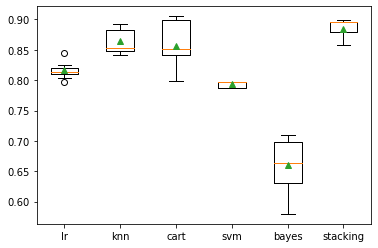

Time Taken : 482.2388038635254


In [54]:
import time
starttime=time.time()
models = get_models_gs()
# evaluate the models and store results
model_estimator,results, names = list(), list(),list()
for name, model in models.items():
    r = evaluate_model(model, X_train, y_train)
    model_estimator.append(r['estimator'])
    results.append(r['test_score'])
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(results), std(results)))
# plot model performance for comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()

print('Time Taken :', time.time()-starttime)

In [55]:
models['stacking']

StackingClassifier(cv=5,
                   estimators=[('lr',
                                LogisticRegression(C=2, max_iter=10000,
                                                   solver='sag')),
                               ('knn',
                                KNeighborsClassifier(metric='euclidean',
                                                     n_neighbors=3,
                                                     weights='distance')),
                               ('cart',
                                DecisionTreeClassifier(max_depth=8,
                                                       max_leaf_nodes=30,
                                                       min_samples_leaf=3,
                                                       min_samples_split=5,
                                                       random_state=42)),
                               ('svm', SVC(C=0.5, kernel='linear')),
                               ('bayes', GaussianNB())],
          

In [56]:
trainmodel=models['stacking'].fit(X_train,y_train)

In [57]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score

def modelReport(y_test,y_predict):
    accuracyscore=accuracy_score(y_test.to_numpy(),y_predict)
    print('Accuracy Score: ',accuracyscore) 
    print(confusion_matrix(y_test.to_numpy(),y_predict))
    print("ROC_AUC Score :",roc_auc_score(y_test.to_numpy(),y_predict))

    # Print the precision and recall, among other metrics
    report=classification_report(y_test, y_predict, digits=3)
    print(report)
    print("Time Taken : ", time.time()-starttime)

In [58]:
y_predict=trainmodel.predict(X_test)
modelReport(y_test,y_predict)

Accuracy Score:  0.9223300970873787
[[79  3]
 [ 5 16]]
ROC_AUC Score : 0.8626596980255516
              precision    recall  f1-score   support

           0      0.940     0.963     0.952        82
           1      0.842     0.762     0.800        21

    accuracy                          0.922       103
   macro avg      0.891     0.863     0.876       103
weighted avg      0.920     0.922     0.921       103

Time Taken :  507.18750190734863


## Result 1:

Min Number Of Songs In Playlists=200

Train Size=412

Test Size= 103

Query Playlist's 'pid' number=41

Accuracy Score:  0.6893203883495146

[[39 18]

[14 32]]

ROC_AUC Score : 0.6899313501144164

                precision    recall  f1-score   support

           0      0.736     0.684     0.709        57
           1      0.640     0.696     0.667        46

    accuracy                          0.689       103
    macro avg     0.688     0.690     0.688       103
    weighted avg  0.693     0.689     0.690       103

Time Taken :  784.2084491252899

* LogisticRegression(C=10, max_iter=10000, solver='newton-cg')
    
    {'C': 10, 'max_iter': 10000, 'solver': 'newton-cg'}
    
    0.6765156647569925
* KNeighborsClassifier(metric='euclidean', n_neighbors=11, weights='distance')
    
    {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'distance'}
    
    0.6812055702111431
* DecisionTreeClassifier(max_depth=8, max_leaf_nodes=30, min_samples_leaf=3,
                       min_samples_split=40, random_state=42)
    
    {'max_depth': 8, 'max_leaf_nodes': 30, 'min_samples_leaf': 3, 'min_samples_split': 40}
    
    0.6918018109161583
* SVC(C=10, kernel='linear')
    
    {'C': 10, 'kernel': 'linear'}
    
    0.6786775104702691


>lr 0.670 (0.054)


>knn 0.655 (0.046)

>cart 0.652 (0.044)

>svm 0.660 (0.047)

>bayes 0.660 (0.051)

>stacking 0.661 (0.047)

Time Taken : 606.3490669727325


## Result 2:

####Min Number Of Songs In Playlists=200

Train Size=412

Test Size= 103

Query Playlist's 'pid' number=456

Accuracy Score:  0.6129032258064516

[[23 21]

[15 34]]

ROC_AUC Score : 0.6083024118738404

                precision    recall  f1-score   support

           0      0.605     0.523     0.561        44
       
           1      0.618     0.694     0.654        49

    accuracy                          0.613        93
   
    macro avg     0.612     0.608     0.607        93
   
    weighted avg  0.612     0.613     0.610        93

Time Taken :  690.987654209137


* LogisticRegression(C=10, max_iter=10000, solver='newton-cg')

    {'C': 10, 'max_iter': 10000, 'solver': 'newton-cg'}

    0.6253916298962279

* KNeighborsClassifier(metric='manhattan', n_neighbors=3, weights='distance')

    {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}

    0.6185274004803933

* DecisionTreeClassifier(max_depth=8, max_leaf_nodes=30, min_samples_leaf=10,
                       min_samples_split=5, random_state=42)

    {'max_depth': 8, 'max_leaf_nodes': 30, 'min_samples_leaf': 10, 'min_samples_split': 5}

    0.6316585051299329

* SVC(C=5, kernel='linear')

    {'C': 5, 'kernel': 'linear'}

    0.6298703511877377

>lr 0.631 (0.058)

>knn 0.604 (0.054)

>cart 0.606 (0.046)

>svm 0.615 (0.053)

>bayes 0.603 (0.061)

>stacking 0.602 (0.058)

Time Taken : 660.9139928817749

## Result 3:

Min Number Of Songs In Playlists=100

Train Size=252

Test Size= 73

Query Playlist's 'pid' number=402

Accuracy Score:  0.7619047619047619

[[31  4]

[11 17]]

ROC_AUC Score : 0.7464285714285714

                precision    recall  f1-score   support

           0      0.738     0.886     0.805        35
           1      0.810     0.607     0.694        28

    accuracy                          0.762        63
    macro avg     0.774     0.746     0.750        63
    weighted avg  0.770     0.762     0.756        63

Time Taken :  343.0101308822632


* LogisticRegression(C=10, max_iter=10000, solver='newton-cg')
    
    {'C': 10, 'max_iter': 10000, 'solver': 'newton-cg'}
    
    0.8275458305117397
* KNeighborsClassifier(metric='manhattan', n_neighbors=11)
    
    {'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'uniform'}
    
    0.738549711625153
* DecisionTreeClassifier(max_depth=8, max_leaf_nodes=30, min_samples_leaf=5,
                       min_samples_split=20, random_state=42)
    
    {'max_depth': 8, 'max_leaf_nodes': 30, 'min_samples_leaf': 5, 'min_samples_split': 20}
    
    0.8117983263006188
* SVC(C=5, kernel='linear')
    
    {'C': 5, 'kernel': 'linear'}
    
    0.8400434173669467

>lr 0.839 (0.030)

>knn 0.780 (0.065)

>cart 0.781 (0.057)

>svm 0.795 (0.056)

>bayes 0.795 (0.053)

>stacking 0.799 (0.050)

Time Taken : 326.9918329715729


## Result 4:

Min Number Of Songs In Playlists=50

Train Size=192

Test Size= 49

Query Playlist's 'pid' number=310

Accuracy Score:  0.7959183673469388

[[35  1]

[ 9  4]]

ROC_AUC Score : 0.6399572649572649

                precision    recall  f1-score   support

           0      0.795     0.972     0.875        36
           1      0.800     0.308     0.444        13

    accuracy                          0.796        49
    macro avg     0.798     0.640     0.660        49
    weighted avg  0.797     0.796     0.761        49

Time Taken :  326.1611089706421


* LogisticRegression(C=10, max_iter=10000, solver='newton-cg')

    {'C': 10, 'max_iter': 10000, 'solver': 'newton-cg'}

    0.8249667361464992
* KNeighborsClassifier(metric='euclidean', n_neighbors=3)
    
    {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'uniform'}
    
    0.8277004320511725
* DecisionTreeClassifier(max_depth=8, max_leaf_nodes=30, min_samples_leaf=3,
                       min_samples_split=5, random_state=42)
    
    {'max_depth': 8, 'max_leaf_nodes': 30, 'min_samples_leaf': 3, 'min_samples_split': 5}

    0.8299686403278494
* SVC(C=10, kernel='linear')
    
    {'C': 10, 'kernel': 'linear'}

    0.8216948401256543

>lr 0.817 (0.035)

>knn 0.812 (0.035)

>cart 0.807 (0.047)

>svm 0.803 (0.048)

>bayes 0.793 (0.049)

>stacking 0.787 (0.052)

Time Taken : 315.00080585479736

## Result 5:
Min Number Of Songs In Playlists=50
Train Size=411

Test Size= 103
Query Playlist's 'pid' number=17

Accuracy Score:  0.9223300970873787

[[79  3]

[ 5 16]]

ROC_AUC Score : 0.8626596980255516

                precision    recall  f1-score   support

           0      0.940     0.963     0.952        82
           1      0.842     0.762     0.800        21

    accuracy                          0.922       103
    macro avg     0.891     0.863     0.876       103
    weighted avg  0.920     0.922     0.921       103

Time Taken :  507.18750190734863


* LogisticRegression(C=2, max_iter=10000, solver='sag')

    {'C': 2, 'max_iter': 10000, 'solver': 'sag'}

    0.8206366424375686
* KNeighborsClassifier(metric='euclidean', n_neighbors=3, weights='distance')
    
    {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'distance'}

    0.8779087333975599
* DecisionTreeClassifier(max_depth=8, max_leaf_nodes=30, min_samples_leaf=3,
                       min_samples_split=5, random_state=42)

    {'max_depth': 8, 'max_leaf_nodes': 30, 'min_samples_leaf': 3, 'min_samples_split': 5}

    0.8883669503228082
* SVC(C=0.5, kernel='linear')

    {'C': 0.5, 'kernel': 'linear'}
    
    0.7936999636838333

>lr 0.817 (0.013)

>knn 0.841 (0.029)

>cart 0.846 (0.033)

>svm 0.833 (0.037)

>bayes 0.798 (0.079)

>stacking 0.812 (0.079)

Time Taken : 482.2388038635254